# **METEORITES SIGHTSEEINGS**

In [1]:
!pip install jupyterlab-hide-code
!pip install geopandas
!pip install plotly
!pip install bokeh
!pip install geojson

In [2]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

# Click here to display code

To toggle the HTML code, you can use the toggle button.


# **WHAT ARE METEORITES?**

According to the NASA: 
A meteorite is a solid piece of debris from an object, such as a comet, asteroid, or meteoroid, that originates in outer space and survives its passage through the atmosphere to reach the surface of a planet or moon. When the object enters the atmosphere, various factors like friction, pressure, and chemical interactions with the atmospheric gases cause it to heat up and radiate that energy. It then becomes a meteor and forms a fireball, also known as a shooting star or falling star.

Scientists estimate that about 48.5 tons (44 tonnes or 44,000 kilograms) of meteoritic material falls on Earth each day.

In this project, the main objective would be to know the most frecuent locations for **sightseeing meteorites**.

https://ares.jsc.nasa.gov/meteorite-falls/what-are-meteorites/f)s/

In [3]:
from IPython.display import display, HTML
# Code HTML Centered
html_code = '''
<div style="display: flex; justify-content: center;">
    <img src="C:\\Users\\migde\\OneDrive\\Escritorio\\DSPT12\\individual-project-IVELIZESUAREZ\\Meteorites\\Meteoroid_meteor_meteorite.gif" alt="GIF de Meteorito">
</div>
'''
# Show HTML
display(HTML(html_code))


This dataset was downloaded from [NASA's Data Portal](https://data.nasa.gov/Space-Science/Meteorite-Landings/gh4gfh/about_data), and contains information on all known meteorite landings with the following fields:
- **name**: the name of the meteorite (typically a location, often modified with a number, year, composition, etc.).
- **id**: the unique ID of the meteorite.
- **nametype**: one of the following: valid - a typical meteorite, or relict - a meteorite that has been highly degraded by weather on Earth.
- **recclass**: the class of the meteorite, based on physical, chemical, and other [characteristics](https://en.wikipedia.org/wiki/Meteorite_classification).
- **mass_(g)**: mass in grams.
- **fall**: indicates whether the meteorite was seen falling or was discovered afterward. 
  - Fell: the meteorite's fall was observed.
  - Found: the meteorite's fall was not observed.
- **year**: the year the meteorite fell or was found.
- **reclat**: the latitude of the meteorite's landing.
- **reclong**: the longitude of the meteorite's landing.
- **GeoLocation**: a tuple enclosed in parentheses and separated by commas, combining reclat d reclong.
tude*
- *geojson*ude
- geojson


In [123]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import folium
import geojson
from numpy import NaN
from collections import Counter
import re
import geopandas as gdp
from geopandas import GeoDataFrame
from shapely.geometry import Point
import plotly.express as px
from bokeh.plotting import figure, output_notebook, show
from bokeh.transform import dodge
from IPython.display import HTML
import webbrowser

In [5]:
meteo_db = pd.read_csv("C:/Users/migde/OneDrive/Escritorio/DSPT12/individual-project-IVELIZESUAREZ/Meteorite_Landings_20240304.csv", delimiter=',')

In [6]:
meteo_db.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45716 entries, 0 to 45715
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         45716 non-null  object 
 1   id           45716 non-null  int64  
 2   nametype     45716 non-null  object 
 3   recclass     45716 non-null  object 
 4   mass (g)     45585 non-null  float64
 5   fall         45716 non-null  object 
 6   year         45425 non-null  float64
 7   reclat       38401 non-null  float64
 8   reclong      38401 non-null  float64
 9   GeoLocation  38401 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 3.5+ MB


In [7]:
meteo_db.head(20)

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)"
5,Adhi Kot,379,Valid,EH4,4239.0,Fell,1919.0,32.10000,71.80000,"(32.1, 71.8)"
6,Adzhi-Bogdo (stone),390,Valid,LL3-6,910.0,Fell,1949.0,44.83333,95.16667,"(44.83333, 95.16667)"
7,Agen,392,Valid,H5,30000.0,Fell,1814.0,44.21667,0.61667,"(44.21667, 0.61667)"
8,Aguada,398,Valid,L6,1620.0,Fell,1930.0,-31.60000,-65.23333,"(-31.6, -65.23333)"
9,Aguila Blanca,417,Valid,L,1440.0,Fell,1920.0,-30.86667,-64.55000,"(-30.86667, -64.55)"


According to the information shown on the previous tables, the most "important" or  "notable" variables for the analysis implemented are latitude, longitude, and year or the fall or found.
The rows without those values, even though they have some useful insights and observations are not essential to this analysis, so the data prep mandatory is to delete or discard the rows with null values for year, latitude & longitude, if any. (Mainly also because those values are going to be hard to find, as this dataset is highly reliable, NASA provided)

In [8]:
meteo_db.dropna(how="all", subset =["year","reclat","reclong"], inplace = True)

In [9]:
meteo_db.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45603 entries, 0 to 45715
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   name         45603 non-null  object 
 1   id           45603 non-null  int64  
 2   nametype     45603 non-null  object 
 3   recclass     45603 non-null  object 
 4   mass (g)     45477 non-null  float64
 5   fall         45603 non-null  object 
 6   year         45425 non-null  float64
 7   reclat       38401 non-null  float64
 8   reclong      38401 non-null  float64
 9   GeoLocation  38401 non-null  object 
dtypes: float64(4), int64(1), object(5)
memory usage: 3.8+ MB


In [10]:
meteo_db.head(20)

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,1880.0,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,1951.0,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,1952.0,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976.0,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,1902.0,-33.16667,-64.95000,"(-33.16667, -64.95)"
5,Adhi Kot,379,Valid,EH4,4239.0,Fell,1919.0,32.10000,71.80000,"(32.1, 71.8)"
6,Adzhi-Bogdo (stone),390,Valid,LL3-6,910.0,Fell,1949.0,44.83333,95.16667,"(44.83333, 95.16667)"
7,Agen,392,Valid,H5,30000.0,Fell,1814.0,44.21667,0.61667,"(44.21667, 0.61667)"
8,Aguada,398,Valid,L6,1620.0,Fell,1930.0,-31.60000,-65.23333,"(-31.6, -65.23333)"
9,Aguila Blanca,417,Valid,L,1440.0,Fell,1920.0,-30.86667,-64.55000,"(-30.86667, -64.55)"


There were 110 deleted rows, which hadn't had any values for year, latitude and longitude (combined)
Those values were the 0,24% of the original dataset of 45716 values. 
Nevertheless, there are still some missing values, as shown:

In [11]:
meteo_db.isnull().sum()

name              0
id                0
nametype          0
recclass          0
mass (g)        126
fall              0
year            178
reclat         7202
reclong        7202
GeoLocation    7202
dtype: int64

One of these columns with missing values, (mass (g)), can be fine-tuned so it has values for all the meteorites.

In [12]:
meteo_mass = meteo_db.sort_values(by = ('mass (g)'), ascending = False)
meteo_mass

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
16392,Hoba,11890,Valid,"Iron, IVB",60000000.0,Found,1920.0,-19.58333,17.91667,"(-19.58333, 17.91667)"
5373,Cape York,5262,Valid,"Iron, IIIAB",58200000.0,Found,1818.0,76.13333,-64.93333,"(76.13333, -64.93333)"
5365,Campo del Cielo,5247,Valid,"Iron, IAB-MG",50000000.0,Found,1575.0,-27.46667,-60.58333,"(-27.46667, -60.58333)"
5370,Canyon Diablo,5257,Valid,"Iron, IAB-MG",30000000.0,Found,1891.0,35.05000,-111.03333,"(35.05, -111.03333)"
3455,Armanty,2335,Valid,"Iron, IIIE",28000000.0,Found,1898.0,47.00000,88.00000,"(47.0, 88.0)"
...,...,...,...,...,...,...,...,...,...,...
38282,Wei-hui-fu (a),24231,Valid,Iron,NaN,Found,1931.0,NaN,NaN,NaN
38283,Wei-hui-fu (b),24232,Valid,Iron,NaN,Found,1931.0,NaN,NaN,NaN
38285,Weiyuan,24233,Valid,Mesosiderite,NaN,Found,1978.0,35.26667,104.31667,"(35.26667, 104.31667)"
41472,Yamato 792768,28117,Valid,CM2,NaN,Found,1979.0,-71.50000,35.66667,"(-71.5, 35.66667)"


In [13]:
mass_fall  = meteo_db.groupby(["fall"])['mass (g)'].mean()
mass_fall

fall
Fell     47070.715023
Found    12489.306826
Name: mass (g), dtype: float64

As there are Found and Fell Meteorites, the mean values for the masses of both varies significantly. The "Found" tend to weigh less than the "Fell". The replacement of the NaN values would be grouped by said categories (Fell & Found), replacing those mean values in the corresponding rows (the mean of Fell in Fell-Rows and the mean of Found in Found-Rows), as such: 

In [14]:
for index, row in meteo_db.iterrows():
    if pd.isna(row["mass (g)"]) and row["fall"] == "Found":
        meteo_db.at[index, "mass (g)"] = 12489.306826
print(meteo_db)

             name     id nametype              recclass  mass (g)   fall  \
0          Aachen      1    Valid                    L5      21.0   Fell   
1          Aarhus      2    Valid                    H6     720.0   Fell   
2            Abee      6    Valid                   EH4  107000.0   Fell   
3        Acapulco     10    Valid           Acapulcoite    1914.0   Fell   
4         Achiras    370    Valid                    L6     780.0   Fell   
...           ...    ...      ...                   ...       ...    ...   
45711  Zillah 002  31356    Valid               Eucrite     172.0  Found   
45712      Zinder  30409    Valid  Pallasite, ungrouped      46.0  Found   
45713        Zlin  30410    Valid                    H4       3.3  Found   
45714   Zubkovsky  31357    Valid                    L6    2167.0  Found   
45715  Zulu Queen  30414    Valid                  L3.7     200.0  Found   

         year    reclat    reclong             GeoLocation  
0      1880.0  50.77500   

In [15]:
for index, row in meteo_db.iterrows():
    if pd.isna(row["mass (g)"]) and row["fall"] == "Fell":
        meteo_db.at[index, "mass (g)"] =  47070.715023
print(meteo_db)

             name     id nametype              recclass  mass (g)   fall  \
0          Aachen      1    Valid                    L5      21.0   Fell   
1          Aarhus      2    Valid                    H6     720.0   Fell   
2            Abee      6    Valid                   EH4  107000.0   Fell   
3        Acapulco     10    Valid           Acapulcoite    1914.0   Fell   
4         Achiras    370    Valid                    L6     780.0   Fell   
...           ...    ...      ...                   ...       ...    ...   
45711  Zillah 002  31356    Valid               Eucrite     172.0  Found   
45712      Zinder  30409    Valid  Pallasite, ungrouped      46.0  Found   
45713        Zlin  30410    Valid                    H4       3.3  Found   
45714   Zubkovsky  31357    Valid                    L6    2167.0  Found   
45715  Zulu Queen  30414    Valid                  L3.7     200.0  Found   

         year    reclat    reclong             GeoLocation  
0      1880.0  50.77500   

In [16]:
meteo_db.isnull().sum()

name              0
id                0
nametype          0
recclass          0
mass (g)          0
fall              0
year            178
reclat         7202
reclong        7202
GeoLocation    7202
dtype: int64

There are still missing values in meteo_db in the case of Latitude and Longitude. However, doing some research to find those geological locations, there are some meteors with almost the same names that have the same locations. In such particular cases, it is safe to say that those values share the same locations and those values can be replaced.

In [17]:
meteo_db.sort_values(by = ('reclat'), ascending = True)

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
26208,Mount Howe 88403,16778,Valid,"Iron, ungrouped",2480.700,Found,1988.0,-87.36667,-149.5,"(-87.36667, -149.5)"
26207,Mount Howe 88402,16777,Valid,H5,21.900,Found,1988.0,-87.36667,-149.5,"(-87.36667, -149.5)"
26206,Mount Howe 88401,16776,Valid,Eucrite-br,1622.700,Found,1988.0,-87.36667,-149.5,"(-87.36667, -149.5)"
26205,Mount Howe 88400,16775,Valid,H6,2104.200,Found,1988.0,-87.36667,-149.5,"(-87.36667, -149.5)"
37416,Scott Glacier 98202,23465,Valid,L6,84.300,Found,1998.0,-87.03333,-148.0,"(-87.03333, -148.0)"
...,...,...,...,...,...,...,...,...,...,...
44000,Yamato 981086,37708,Valid,H4,5.227,Found,1998.0,NaN,NaN,NaN
44001,Yamato 981090,37712,Valid,H4,8.682,Found,1998.0,NaN,NaN,NaN
45589,Yamato 984028,40648,Valid,Martian (shergottite),12.342,Found,1998.0,NaN,NaN,NaN
45660,Yambo no. 2,30346,Valid,L3,3.200,Found,1975.0,NaN,NaN,NaN


For the updating of the missing longitude and latitude values, through research there would be assigned default values to those missing coordinates.

In [18]:
mask_long = meteo_db['name'].str.contains("Cumulus") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Cumulus") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [19]:
mask_long = meteo_db['name'].str.contains("LaPaz") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("LaPaz") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [20]:
mask_long = meteo_db['name'].str.contains("Allan") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Allan") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [21]:
mask_long = meteo_db['name'].str.contains("Grosvenor") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Grosvenor") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [22]:
mask_long = meteo_db['name'].str.contains("Nunatak") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Nunatak") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [23]:
mask_long = meteo_db['name'].str.contains("Dominion") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Dominion") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [24]:
mask_long = meteo_db['name'].str.contains("MacAlpine") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("MacAlpine") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [25]:
mask_long = meteo_db['name'].str.contains("Yamato") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Yamato") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [26]:
mask_long = meteo_db['name'].str.contains("Miller Range") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Miller Range") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [27]:
mask_long = meteo_db['name'].str.contains("Roberts Massif") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Roberts Massif") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [28]:
mask_long = meteo_db['name'].str.contains("Scott Glacier") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Scott Glacier") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [29]:
mask_long = meteo_db['name'].str.contains("MacKay Glacier") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("MacKay Glacier") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [30]:
mask_long = meteo_db['name'].str.contains("Sandford Cliffs") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Sandford Cliffs") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [31]:
mask_long = meteo_db['name'].str.contains("Finger Ridge") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Finger Ridge") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [32]:
mask_long = meteo_db['name'].str.contains("Mount Pratt") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Mount Pratt") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [33]:
mask_long = meteo_db['name'].str.contains("Angelo") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Angelo") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-0.071389)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-75.250973)

In [34]:
mask_long = meteo_db['name'].str.contains("Northwest Africa") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Northwest Africa") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-7.09262)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(31.791702)

In [35]:
mask_long = meteo_db['name'].str.contains("Sahara") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Sahara") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(-12.885834)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(24.215527)

In [36]:
mask_long = meteo_db['name'].str.contains("Nullar") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Nullar") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(133.775136)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(-25.274398)

In [37]:
mask_long = meteo_db['name'].str.contains("Arabian") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Arabian") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(53.847818)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(23.424076)

In [38]:
mask_long = meteo_db['name'].str.contains("Dar al Gani") & meteo_db['reclong'].isnull()
mask_lat = meteo_db['name'].str.contains("Dar al Gani") & meteo_db['reclat'].isnull()
meteo_db.loc[mask_long, 'reclong'] = np.float64(17.228331)
meteo_db.loc[mask_lat, 'reclat'] = np.float64(26.3351)

In [39]:
meteo_db.isnull().sum()

name              0
id                0
nametype          0
recclass          0
mass (g)          0
fall              0
year            178
reclat           74
reclong          74
GeoLocation    7202
dtype: int64

As shown, the data filled was of 7128 rows, (which were repeated and/or "brother" values and therefore, aproximately same locations of landings/sightseeings.) Thus, the data that could be deleted is of 74 rows for empty latitude and longitude, those values represent the 0,16% of the 45716 original values.

Also, the column GeoLocation will be dropped, as it represents the Recommended Latitude and Longitude that is already represented in reclat & reclong.


In [40]:
meteo_db.dropna(how="all", subset =["reclat","reclong"], inplace = True)

In [41]:
meteo_db = meteo_db.drop(["GeoLocation"], axis=1)

In [42]:
meteo_db.isnull().sum()

name          0
id            0
nametype      0
recclass      0
mass (g)      0
fall          0
year        178
reclat        0
reclong       0
dtype: int64

As for year of the sightseeing/landing/founding, there are no cohesive correlations between the values, for example, for the meteor "Jiddat al Harasis", depending on the code, there are several years of said sightseeing/landing. So the most clean pre-processing engineering would be dropping those values as well, as it can be misleading if one value for all is assumed.

In [43]:
meteo_year = meteo_db.sort_values(by = ('year'), ascending = False)
meteo_year

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong
30682,Northwest Africa 7701,57150,Valid,CK6,55.0,Found,2101.0,0.00000,0.00000
30730,Northwest Africa 7755,57166,Valid,Martian (shergottite),30.0,Found,2013.0,0.00000,0.00000
194,Chelyabinsk,57165,Valid,LL5,100000.0,Fell,2013.0,54.81667,61.11667
30780,Northwest Africa 7862,57426,Valid,L4/5,317.0,Found,2013.0,0.00000,0.00000
30779,Northwest Africa 7861,57425,Valid,L5,611.0,Found,2013.0,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...
38207,Valencia,24147,Valid,H5,33500.0,Found,NaN,39.00000,-0.03333
38231,Villa Regina,53827,Valid,"Iron, IIIAB",5030.0,Found,NaN,-39.10000,-67.06667
38308,Wietrzno-Bobrka,24259,Valid,Iron,376.0,Found,NaN,49.41667,21.70000
38335,Wiltshire,56143,Valid,H5,92750.0,Found,NaN,51.14967,-1.81000


In [44]:
meteo_db.dropna(how="all", subset =["year"], inplace = True)

In [45]:
meteo_db.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45351 entries, 0 to 45715
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      45351 non-null  object 
 1   id        45351 non-null  int64  
 2   nametype  45351 non-null  object 
 3   recclass  45351 non-null  object 
 4   mass (g)  45351 non-null  float64
 5   fall      45351 non-null  object 
 6   year      45351 non-null  float64
 7   reclat    45351 non-null  float64
 8   reclong   45351 non-null  float64
dtypes: float64(4), int64(1), object(4)
memory usage: 3.5+ MB


A total of 365 rows (0,80%) were removed from the database, from the 45716 original values.

In [46]:
meteo_db.head(20)

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong
0,Aachen,1,Valid,L5,21.000000,Fell,1880.0,50.77500,6.08333
1,Aarhus,2,Valid,H6,720.000000,Fell,1951.0,56.18333,10.23333
2,Abee,6,Valid,EH4,107000.000000,Fell,1952.0,54.21667,-113.00000
3,Acapulco,10,Valid,Acapulcoite,1914.000000,Fell,1976.0,16.88333,-99.90000
4,Achiras,370,Valid,L6,780.000000,Fell,1902.0,-33.16667,-64.95000
5,Adhi Kot,379,Valid,EH4,4239.000000,Fell,1919.0,32.10000,71.80000
6,Adzhi-Bogdo (stone),390,Valid,LL3-6,910.000000,Fell,1949.0,44.83333,95.16667
7,Agen,392,Valid,H5,30000.000000,Fell,1814.0,44.21667,0.61667
8,Aguada,398,Valid,L6,1620.000000,Fell,1930.0,-31.60000,-65.23333
9,Aguila Blanca,417,Valid,L,1440.000000,Fell,1920.0,-30.86667,-64.55000


The type of the year column must be changed to an integer.

In [47]:
meteo_db['year'] = meteo_db['year'].astype(int)

In [48]:
meteo_db.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45351 entries, 0 to 45715
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   name      45351 non-null  object 
 1   id        45351 non-null  int64  
 2   nametype  45351 non-null  object 
 3   recclass  45351 non-null  object 
 4   mass (g)  45351 non-null  float64
 5   fall      45351 non-null  object 
 6   year      45351 non-null  int32  
 7   reclat    45351 non-null  float64
 8   reclong   45351 non-null  float64
dtypes: float64(3), int32(1), int64(1), object(4)
memory usage: 3.3+ MB


In [49]:
meteo_year = meteo_db.sort_values(by = ('year'), ascending = False)
meteo_year

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong
30682,Northwest Africa 7701,57150,Valid,CK6,55.000000,Found,2101,0.00000,0.00000
30730,Northwest Africa 7755,57166,Valid,Martian (shergottite),30.000000,Found,2013,0.00000,0.00000
194,Chelyabinsk,57165,Valid,LL5,100000.000000,Fell,2013,54.81667,61.11667
30780,Northwest Africa 7862,57426,Valid,L4/5,317.000000,Found,2013,0.00000,0.00000
30779,Northwest Africa 7861,57425,Valid,L5,611.000000,Found,2013,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...
283,Ensisheim,10039,Valid,LL6,127000.000000,Fell,1491,47.86667,7.35000
856,Rivolta de Bassi,22614,Valid,Stone-uncl,103.300000,Fell,1490,45.48333,9.51667
278,Elbogen,7823,Valid,"Iron, IID",107000.000000,Fell,1399,50.18333,12.73333
679,Narni,16914,Valid,Stone-uncl,47070.715023,Fell,920,42.51667,12.51667


After doing research, the year that the meteorite "Northwest Africa 7701" was found, was actually in 2010.

In [50]:
meteo_db.loc[30682, 'year'] = 2010

In [51]:
meteo_year = meteo_db.sort_values(by = ('year'), ascending = False)
meteo_year

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong
30781,Northwest Africa 7863,57427,Valid,LL5,1000.000000,Found,2013,0.00000,0.00000
30780,Northwest Africa 7862,57426,Valid,L4/5,317.000000,Found,2013,0.00000,0.00000
30762,Northwest Africa 7812,57258,Valid,Angrite,46.200000,Found,2013,0.00000,0.00000
30774,Northwest Africa 7855,57420,Valid,H4,916.000000,Found,2013,0.00000,0.00000
30775,Northwest Africa 7856,57421,Valid,LL6,517.000000,Found,2013,0.00000,0.00000
...,...,...,...,...,...,...,...,...,...
283,Ensisheim,10039,Valid,LL6,127000.000000,Fell,1491,47.86667,7.35000
856,Rivolta de Bassi,22614,Valid,Stone-uncl,103.300000,Fell,1490,45.48333,9.51667
278,Elbogen,7823,Valid,"Iron, IID",107000.000000,Fell,1399,50.18333,12.73333
679,Narni,16914,Valid,Stone-uncl,47070.715023,Fell,920,42.51667,12.51667


There is another column to be pre-processed and it is the RECCLASS column. According to the scheme shown below, it is clear that two classifications must be done (*Chondrites, Irons, Achondrites or Stony Irons* and its subtypes):

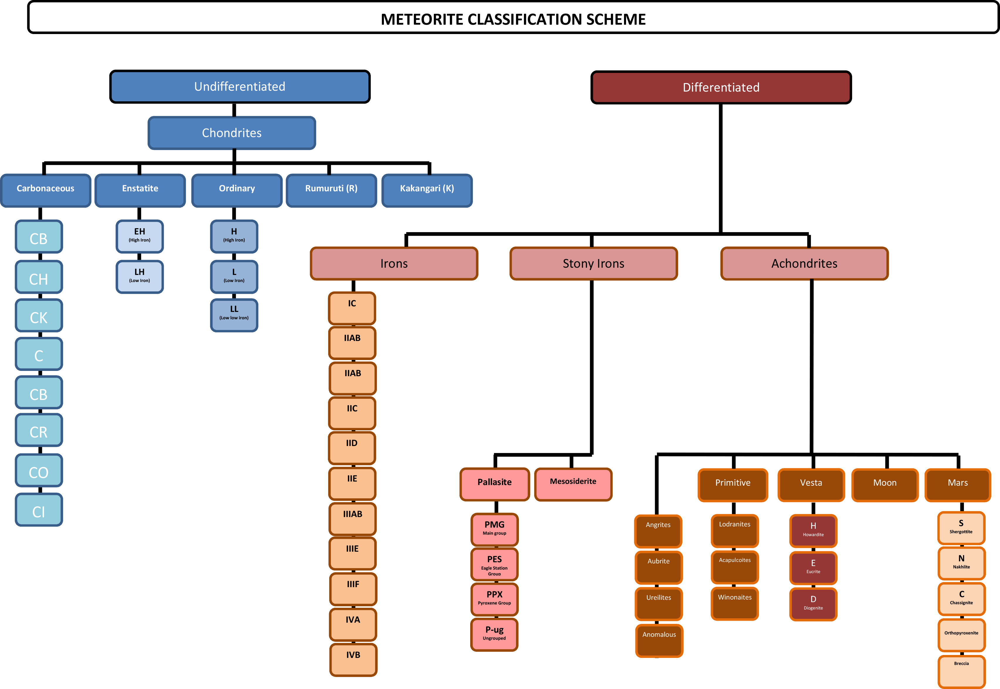

In [52]:
class_meteor = meteo_db.groupby('recclass').count()['name']
print(class_meteor.sort_values(ascending=False))

recclass
L6              8236
H5              7102
L5              4754
H6              4515
H4              4183
                ... 
L(LL)3.5-3.7       1
L(H)3              1
K                  1
CH3                1
L/LL3.6/3.7        1
Name: name, Length: 460, dtype: int64


In [53]:
meteo_db['recclass'] = meteo_db['recclass'].str.replace('~', '').str.replace('?', '')
meteo_db

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong
0,Aachen,1,Valid,L5,21.0,Fell,1880,50.77500,6.08333
1,Aarhus,2,Valid,H6,720.0,Fell,1951,56.18333,10.23333
2,Abee,6,Valid,EH4,107000.0,Fell,1952,54.21667,-113.00000
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976,16.88333,-99.90000
4,Achiras,370,Valid,L6,780.0,Fell,1902,-33.16667,-64.95000
...,...,...,...,...,...,...,...,...,...
45711,Zillah 002,31356,Valid,Eucrite,172.0,Found,1990,29.03700,17.01850
45712,Zinder,30409,Valid,"Pallasite, ungrouped",46.0,Found,1999,13.78333,8.96667
45713,Zlin,30410,Valid,H4,3.3,Found,1939,49.25000,17.66667
45714,Zubkovsky,31357,Valid,L6,2167.0,Found,2003,49.78917,41.50460


In [54]:
meteo_db['recclass'] = meteo_db['recclass'].str.strip()

In [55]:
class_meteor = meteo_db.groupby('recclass').count()['name']
print(class_meteor.sort_values(ascending=False))

recclass
L6               8383
H5               7235
L5               4807
H6               4538
H4               4212
                 ... 
L3.2-3.5            1
L3.2-3.6            1
L3.3-3.5            1
L3.3-3.6            1
Iron, IIIE-an       1
Name: name, Length: 426, dtype: int64


There are 437 different types of meteors, each within another major classification, so then it would be necessary to apply another column for the main class or category to which that class belongs. With that in mind, it's also necessary to make a feature engineering decisions based on the number of classifications, because there are several values repeated.

In [56]:
meteo_db['recclass'] = meteo_db['recclass'].replace(['L3.5', 'L3.8', 'L3.4', 'L3.7', 'L3.6', 'L3-6', 'L3.9','L3.3', 'L3.2','L3-5','L3.1','L3/4','L3.8-6','L3-4','L3.9-6','L3.7-6','L3-4','L3.8-an','L3.9/4','L3.0-3.7', 'L3.0-3.9', 'L3.00', 'L3.10', 'L3.2-3.5', 'L3.2-3.6', 'L3.3-3.5', 'L3.3-3.6','L3.9-5','L3.5-3.8','L3.5-3.9','L3.5-5','L3.6-4','L3.7-3.9','L3.7-4','L3.7-6', 'L3-7','L3.7/3.8','L3.8-an','L3.9/4','L3.9/4','L3-melt breccia','L3.3-3.7', 'L3.5-3.7','L3.4-3.7','L3.05','L3.8-5'], 'L3')

In [57]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["LL5", "LL6", "LL4", "LL", "LL3", "LL-melt breccia", "LL5/6", "LL5-6", "LL4-6", "LL3.8", "L/LL6", "L/LL3", "LL3.7", "LL7", "LL3.4", "L/LL4", "LL3.5", "LL3.9", "LL3.6", "L/LL5", "LL3.3", "LL3.2", "LL4-5", "LL~5", "LL3-6", "LL-melt rock", "LL(L)3", "LL3.1", "L(LL)3", "LL~6", "L/LL5/6", "LL4/5", "L/LL3.4", "LL3.0", "LL6/7", "L/LL~6", "LL3.8-6", "LL~3", "LL3.15", "LL3.10", "L/LL3-5", "LL-imp melt", "LL6 ", "LL6-melt breccia", "LL3-5", "L/LL~5", "L(LL)3.05", "L/LL3.2", "LL~4/5", "LL~4", "LL<3.5", "L/LL6-an", "L/LL~4", "L/LL5-6", "L/LL4/5", "L/LL4-6", "LL7(?)", "L/LL3.5", "L/LL3.10", "L/LL3-6", "LL3.9/4", "LL3/4", "LL4/6", "LL5-7", "LL6(?)", "LL6-an", "LL3.8-4", "LL3.7-6", "L/LL-melt rock", "LL3-4", "L/LL(?)3", "L/LL", "L(LL)~4", "LL3.00", "LL3.05", "L(LL)6", "LL3.1-3.5", "L(LL)5", "L(LL)3.5-3.7", "L/LL3.6/3.7","LL7()",	"LL6()",	"L/LL()3",	"L(LL)4"], 'LL')

In [58]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Iron, IIIAB",	"Iron, IIAB",	"Iron, ungrouped",	"Iron",	"Iron, IAB-MG",	"Iron, IVA",	"Iron, IAB complex",	"Iron, IAB-ung",	"Iron, IAB-sLL",	"Iron, IID",	"Iron, IAB-sHL",	"Iron, IVB",	"Iron, IIIE",	"Iron, IIE",	"Iron, IC",	"Iron, IAB-sLM",	"Iron, IIIF",	"Iron, IAB-sLH",	"Iron, IIE-an",	"Iron, IIC",	"Iron, IIF",	"Iron, IIG",	"Iron, IVA-an",	"Iron, IAB-sHH",	"Iron, IIIAB?",	"Iron, IAB",	"Iron, IIIAB-an",	"Iron, IAB-an",	"Iron, IC-an",	"Relict iron",	"Iron, IID-an",	"Iron, IIAB-an",	"Iron, IAB-sHL-an",	"Iron, IIE?",	"Iron, IIIE-an"], 'Iron')

In [59]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["H3",	"H3.8",	"H3.7",	"H3.9",	"H3-6",	"H3.6",	"H3-5",	"H3/4",	"H3.5",	"H3.4",	"H3-4",	"H3.3",	"H3.9-6",	"H3.9/4",	"H3.0",	"H3.2-an",	"H3.7-5",	"H3.10",	"H3.6-6",	"H3.2",	"H3.05",	"H3.1",	"H3.8-6",	"H3.9-5",	"H3.8/4",	"H3.8-an",	"H3.2-3.7",	"H3.2-6",	"H3.4/3.5",	"H3.5-4",	"H3.4-5",	"H3.8-5",	"H3.7-6",	"H3.7/3.8",	"H3.8/3.9",	"H3.8-4",	"H3.0-3.4",	"H3-an", "H3 "], 'H3')

In [60]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["H4",	"H4/5",	"H4-6",	"H4-5",	"H4 ",	"H4-an", "H4/6", "H4-melt breccia",	"H4()"], 'H4')

In [61]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Pallasite, PMG", "Pallasite", "Pallasite, PMG-an", "Pallasite, ungrouped",	"Pallasite, PES"], 'Pallasite')

In [62]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Acapulcoite",	"Acapulcoite/Lodranite", "Acapulcoite/lodranite"], 'Acapulcoite')

In [63]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["L6-melt breccia",	"L6/7",	"H/L6",	"L6-melt rock"], 'L6')

In [64]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Lunar (anorth)",	"Lunar",	"Lunar (feldsp. breccia)",	"Lunar (basalt)",	"Lunar (gabbro)",	"Lunar (bas. breccia)",	"Lunar (bas/anor)",	"Lunar (norite)",	"Lunar (bas/gab brec)"], 'Lunar')

In [65]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["R",	"R3",	"R3-4",	"R3-5",	"R3-6",	"R3.4",	"R3.5-4",	"R3.5-6",	"R3.6",	"R3.7",	"R3.8",	"R3.8-5",	"R3.8-6",	"R3.9",	"R3/4",	"R4",	"R4/5",	"R5",	"R6"], 'Rumuruti R')

In [66]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Eucrite",	"Eucrite-Mg rich",	"Eucrite-an",	"Eucrite-br",	"Eucrite-cm",	"Eucrite-mmict",	"Eucrite-pmict",	"Eucrite-unbr"], 'Eucrite')

In [67]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Mesosiderite",	"Mesosiderite-A",	"Mesosiderite-A1",	"Mesosiderite-A2",	"Mesosiderite-A3",	"Mesosiderite-A3/4",	"Mesosiderite-A4",	"Mesosiderite-B",	"Mesosiderite-B1",	"Mesosiderite-B2",	"Mesosiderite-B4",	"Mesosiderite-C",	"Mesosiderite-C2",	"Mesosiderite-an"], 'Mesosiderite')

In [68]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Ureilite",	"Ureilite-an",	"Ureilite-pmict"], 'Ureilite')

In [69]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["C",	"C1/2-ung",	"C2",	"C2-ung",	"C3-ung",	"C3.0-ung",	"C3/4-ung",	"C4",	"C4-ung",	"C4/5",	"C5/6-ung",	"C6"], 'C')

In [70]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["CK",	"CK3",	"CK3-an",	"CK3.8",	"CK3/4",	"CK4",	"CK4-an",	"CK4/5",	"CK5",	"CK5/6",	"CK6"], 'CK')

In [71]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["CB",	"CBa",	"CBb",	"CH/CBb"], 'CB')

In [72]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["CM",	"CM-an",	"CM1",	"CM1/2",	"CM2",	"CM2-an"], 'CM')

In [73]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["CO3",	"CO3.0",	"CO3.1",	"CO3.2",	"CO3.3",	"CO3.4",	"CO3.5",	"CO3.6",	"CO3.7",	"CO3.8"], 'CO')

In [74]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["CB",	"CBa",	"CBb",	"CH/CBb"], 'CB')

In [75]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Achondrite-prim",	"Achondrite-ung"], 'Achondrite')

In [76]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Aubrite",	"Aubrite-an"], 'Aubrite')

In [77]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Martian (OPX)", "Martian (basaltic breccia)",	"Martian (chassignite)", "Martian (nakhlite)", "Martian (shergottite)"], 'Martian')

In [78]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["H",	"H()4",	"H(5)",	"H(L)3",	"H(L)3-an",	"H-an",	"H-imp melt",	"H-melt breccia",	"H-melt rock",	"H-metal",	"H/L3",	"H/L3-4",	"H/L3.5",	"H/L3.6",	"H/L3.7",	"H/L3.9",	"H/L4",	"H/L4-5",	"H/L5",	"H3",	"H4",	"H5",	"H5-6",	"H5-7",	"H5-an","H5-melt breccia",	"H5/6",	"H6",	"H6-melt breccia",	"H6/7",	"H7",	"L(H)3"], 'H')

In [79]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Stone-uncl",	"Stone-ung"], 'Stone')

In [80]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Relict H",	"Relict OC"], 'Relict')

In [81]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["OC",	"OC3"], 'OC')

In [82]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Lodranite", "Lodranite-an"], 'Lodranite')

In [83]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Enst achon",	"Enst achon-ung"], 'Achondrite')

In [84]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Chondrite-fusion crust",	"Chondrite-ung"], 'Chondrite')

In [85]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["Diogenite",	"Diogenite-an",	"Diogenite-olivine", "Diogenite-pm"], 'Diogenite')

In [86]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["EL-melt rock",	"EL3",	"EL3/4",	"EL4",	"EL4/5",	"EL5",	"EL6",	"EL6/7",	"EL7"], 'EL')

In [87]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["EH",	"EH-imp melt",	"EH3",	"EH3/4-an",	"EH4",	"EH4/5",	"EH5",	"EH6",	"EH6-an",	"EH7",	"EH7-an"], 'EH')

In [88]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["CR", "CR-an", "CR1",	"CR2", "CR2-an", "CR7"], 'CR')

In [89]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["E", "E-an",	"E3", "E3-an", "E4",	"E5",	"E5-an", "E6"], 'E')

In [90]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["CV2",	"CV3",	"CV3-an"], 'CV')

In [91]:
meteo_db['recclass'] = meteo_db['recclass'].replace(["L", "L()3",	"L-imp melt", "L-melt breccia",	"L-melt rock",	"L-metal", "L3", "L3.0", "L4",	"L4-5",	"L4-6",	"L4-an",	"L4-melt breccia",	"L4-melt rock",	"L4/5",	"L5",	"L5-6",	"L5-7",	"L5-melt breccia",	"L5/6",	"L6",	"L7"], 'L')

In [92]:
meteo_db['recclass'] = meteo_db['recclass'].str.replace('K3', 'K')

In [93]:
meteo_db['recclass'] = meteo_db['recclass'].str.replace('Howardite-an', 'Howardite')

In [94]:
meteo_db['recclass'] = meteo_db['recclass'].str.replace('Impact melt breccia', 'Chondrite')

In [95]:
meteo_db['recclass'] = meteo_db['recclass'].str.replace('CI1', 'CI')

In [96]:
meteo_db['recclass'] = meteo_db['recclass'].str.replace('CH3', 'CH')

In [97]:
class_meteor = meteo_db.groupby('recclass').count()['name']
print(class_meteor)

recclass
Acapulcoite        61
Achondrite         71
Angrite            21
Aubrite            69
Brachinite         31
C                  46
CB                 19
CH                 22
CI                  9
CK                228
CM                457
CO                389
CR                147
CV                259
Chondrite          20
Diogenite         262
E                 243
EH                170
EL                117
Eucrite           677
Fusion crust        4
H               17808
Howardite         237
Iron             1016
K                   3
L               15682
LL               5998
Lodranite          41
Lunar             162
Martian           117
Mesosiderite      186
OC                 83
Pallasite          93
Relict             65
Rumuruti R        134
Stone              49
Unknown             5
Ureilite          325
Winonaite          25
Name: name, dtype: int64


After applying feature engineering, there are only 39 types of meteors (based on similar characteristics & components) and there must be done some more enineering for the more general classification of the scheme shown (*Chondrites, Irons, Achondrites or Stony Irons*):

In [98]:
import re
# Define the regex patterns for meteorite categories
carbonaceous_pattern = [r'^C', r'^K']
ordinary_pattern = [r'^(H|LL|OC)', r'^L$', r'^Rumuruti R$', r'^Stone$']
achondrite_patterns = [r'^Acapulcoite$', r'^Achondrite$', r'^Angrite$', r'^Aubrite$', r'^Brachinite$', r'^Diogenite$', r'^Eucrite$', r'^Howardite$', r'^Lodranite$', r'^Lunar$', r'^Martian$', r'^Ureilite$', r'^Winonaite$']
enstatite_patterns = [r'^E', r'^EH', r'^EL']
iron_patterns = [r'^Iron$']
stony_iron_patterns = [r'^Mesosiderite', r'^Pallasite']

# Function to assign the meteorite category.
def assign_category(recclass):
    if any(re.match(pattern, recclass) for pattern in carbonaceous_pattern):
        return 'Carbonaceous Chondrite'
    elif any(re.match(pattern, recclass) for pattern in ordinary_pattern):
        return 'Ordinary Chondrite'
    elif any(re.match(pattern, recclass) for pattern in achondrite_patterns):
        return 'Achondrite'
    elif any(re.match(pattern, recclass) for pattern in enstatite_patterns):
        return 'Enstatite Chondrite'
    elif any(re.match(pattern, recclass) for pattern in iron_patterns):
        return 'Iron Meteorite'
    elif any(re.match(pattern, recclass) for pattern in stony_iron_patterns):
        return 'Stony Iron Meteorite'
    else:
        return 'Unknown'  # If it doesn't match any of the patterns, an UNKNOWN value is assigned

 # Create a new column 'Major_class_meteor' and assign the corresponding category
meteo_db['major_class_meteor'] = meteo_db['recclass'].apply(assign_category)

print(meteo_db)

             name     id nametype     recclass  mass (g)   fall  year  \
0          Aachen      1    Valid            L      21.0   Fell  1880   
1          Aarhus      2    Valid            H     720.0   Fell  1951   
2            Abee      6    Valid           EH  107000.0   Fell  1952   
3        Acapulco     10    Valid  Acapulcoite    1914.0   Fell  1976   
4         Achiras    370    Valid            L     780.0   Fell  1902   
...           ...    ...      ...          ...       ...    ...   ...   
45711  Zillah 002  31356    Valid      Eucrite     172.0  Found  1990   
45712      Zinder  30409    Valid    Pallasite      46.0  Found  1999   
45713        Zlin  30410    Valid            H       3.3  Found  1939   
45714   Zubkovsky  31357    Valid            L    2167.0  Found  2003   
45715  Zulu Queen  30414    Valid            L     200.0  Found  1976   

         reclat    reclong    major_class_meteor  
0      50.77500    6.08333    Ordinary Chondrite  
1      56.18333   10.

In [99]:
meteo_db["major_class_meteor"].unique()

array(['Ordinary Chondrite', 'Enstatite Chondrite', 'Achondrite',
       'Unknown', 'Iron Meteorite', 'Carbonaceous Chondrite',
       'Stony Iron Meteorite'], dtype=object)

In [100]:
import re
# Define the regex patterns for each category
chondrite_pattern = r'(Chondrite)'
achondrite_pattern = r'(Achondrite)'
iron_pattern = r'(Iron Meteorite|Stony Iron Meteorite)'
unknown_pattern = r'(Unknown)'

# Function to assign the meteorite category
def assign_category(Major_class_meteor):
    if re.search(chondrite_pattern, Major_class_meteor):
        return 'Chondrite'
    elif re.search(achondrite_pattern, Major_class_meteor):
        return 'Achondrite'
    elif re.search(iron_pattern, Major_class_meteor):
        return 'Iron'
    elif re.search(unknown_pattern, Major_class_meteor):
        return 'Unknown'
    else:
        return 'Unknown'  # If it doesn't match any category, 'Unknown' is assigned

# Create a new column 'meteorite_category' and assign the corresponding category
meteo_db['meteorite_category'] = meteo_db['major_class_meteor'].apply(assign_category)
print(meteo_db)

             name     id nametype     recclass  mass (g)   fall  year  \
0          Aachen      1    Valid            L      21.0   Fell  1880   
1          Aarhus      2    Valid            H     720.0   Fell  1951   
2            Abee      6    Valid           EH  107000.0   Fell  1952   
3        Acapulco     10    Valid  Acapulcoite    1914.0   Fell  1976   
4         Achiras    370    Valid            L     780.0   Fell  1902   
...           ...    ...      ...          ...       ...    ...   ...   
45711  Zillah 002  31356    Valid      Eucrite     172.0  Found  1990   
45712      Zinder  30409    Valid    Pallasite      46.0  Found  1999   
45713        Zlin  30410    Valid            H       3.3  Found  1939   
45714   Zubkovsky  31357    Valid            L    2167.0  Found  2003   
45715  Zulu Queen  30414    Valid            L     200.0  Found  1976   

         reclat    reclong    major_class_meteor meteorite_category  
0      50.77500    6.08333    Ordinary Chondrite     

A classification of the weight/mass of the meteorites is done through this criteria:
If the mass of the meteor is 300 grams or less, it is categorized as 'Small'.
If the mass of the meteor is more than 300 grams but less than or equal to 1000 grams, it is categorized as 'Medium'.
If the mass of the meteor is greater than 1000 grams, it is categorized as 'Large'.

In [101]:
meteo_db = meteo_db.rename(columns ={"mass (g)" : "mass_g"})
meteo_db = meteo_db.rename(columns={'mass_(g)': 'mass_g'})

In [102]:
def assign_size(mass_g):
    if mass_g <= 300:
        return 'Small'
    elif 300 < mass_g <= 1000:
        return 'Medium'
    elif mass_g > 1000:
        return 'Large'

# Create a new column 'meteor_size' and assign the corresponding category
meteo_db['meteor_size'] = meteo_db['mass_g'].apply(assign_size)
print(meteo_db)

             name     id nametype     recclass    mass_g   fall  year  \
0          Aachen      1    Valid            L      21.0   Fell  1880   
1          Aarhus      2    Valid            H     720.0   Fell  1951   
2            Abee      6    Valid           EH  107000.0   Fell  1952   
3        Acapulco     10    Valid  Acapulcoite    1914.0   Fell  1976   
4         Achiras    370    Valid            L     780.0   Fell  1902   
...           ...    ...      ...          ...       ...    ...   ...   
45711  Zillah 002  31356    Valid      Eucrite     172.0  Found  1990   
45712      Zinder  30409    Valid    Pallasite      46.0  Found  1999   
45713        Zlin  30410    Valid            H       3.3  Found  1939   
45714   Zubkovsky  31357    Valid            L    2167.0  Found  2003   
45715  Zulu Queen  30414    Valid            L     200.0  Found  1976   

         reclat    reclong    major_class_meteor meteorite_category  \
0      50.77500    6.08333    Ordinary Chondrite    

The only data remaining to be cleaned is latitude and longitude. First a code is assigned to see if the data is correct:

In [103]:
# Find erroneous latitude values
erroneous_latitude = meteo_db[~meteo_db['reclat'].between(-90, 90)]

# Find erroneous longitude values
erroneous_longitude = meteo_db[~meteo_db['reclong'].between(-180, 180)]

# Display erroneous values
print("Erroneous latitude values:")
print(erroneous_latitude)

print("\nErroneous longitude values:")
print(erroneous_longitude)

Erroneous latitude values:
Empty DataFrame
Columns: [name, id, nametype, recclass, mass_g, fall, year, reclat, reclong, major_class_meteor, meteorite_category, meteor_size]
Index: []

Erroneous longitude values:
                   name     id nametype recclass        mass_g   fall  year  \
22946  Meridiani Planum  32789    Valid     Iron  12489.306826  Found  2005   

        reclat    reclong major_class_meteor meteorite_category meteor_size  
22946 -1.94617  354.47333     Iron Meteorite               Iron       Large  


After some reserarch, the meteorite shown (Meridiani Planum) landed on Mars: *Heat Shield Rock is a basketball-sized iron-nickel meteorite found on the Meridiani Planum plain of Mars by the Mars rover Opportunity in January 2005.* so this data is not relevant to the data set.

In [104]:
# Delete the row with the erroneous longitude value
meteo_db = meteo_db.drop(index=22946)

A total of 366 rows (0,80%) were removed from the database, from the 45716 original values, so the total dataset is of 45350 values/landings.

In [105]:
print(meteo_db.columns)

Index(['name', 'id', 'nametype', 'recclass', 'mass_g', 'fall', 'year',
       'reclat', 'reclong', 'major_class_meteor', 'meteorite_category',
       'meteor_size'],
      dtype='object')


The dataset is clean to be visualized properly.

In [106]:
meteo_db.info()

<class 'pandas.core.frame.DataFrame'>
Index: 45350 entries, 0 to 45715
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                45350 non-null  object 
 1   id                  45350 non-null  int64  
 2   nametype            45350 non-null  object 
 3   recclass            45350 non-null  object 
 4   mass_g              45350 non-null  float64
 5   fall                45350 non-null  object 
 6   year                45350 non-null  int32  
 7   reclat              45350 non-null  float64
 8   reclong             45350 non-null  float64
 9   major_class_meteor  45350 non-null  object 
 10  meteorite_category  45350 non-null  object 
 11  meteor_size         45350 non-null  object 
dtypes: float64(3), int32(1), int64(1), object(7)
memory usage: 4.3+ MB


In [107]:
meteo_db.describe()

,id,mass_g,year,reclat,reclong
count,45350.000000,4.535000e+04,45350.000000,45350.000000,45350.00000
mean,26818.343991,1.334250e+04,1991.871488,-38.562803,51.16248
std,16839.211678,5.764653e+05,24.989889,47.238912,77.74401
min,1.000000,0.000000e+00,860.000000,-87.366670,-165.43333
25%,12646.250000,7.162500e+00,1987.000000,-76.268467,0.00000
50%,24187.500000,3.230000e+01,1998.000000,-71.500000,35.66667
75%,40574.000000,2.022750e+02,2003.000000,0.000000,156.01070
max,57458.000000,6.000000e+07,2013.000000,81.166670,178.20000


In [108]:
meteo_db.head(20)

,name,id,nametype,recclass,mass_g,fall,year,reclat,reclong,major_class_meteor,meteorite_category,meteor_size
0,Aachen,1,Valid,L,21.000000,Fell,1880,50.77500,6.08333,Ordinary Chondrite,Chondrite,Small
1,Aarhus,2,Valid,H,720.000000,Fell,1951,56.18333,10.23333,Ordinary Chondrite,Chondrite,Medium
2,Abee,6,Valid,EH,107000.000000,Fell,1952,54.21667,-113.00000,Enstatite Chondrite,Chondrite,Large
3,Acapulco,10,Valid,Acapulcoite,1914.000000,Fell,1976,16.88333,-99.90000,Achondrite,Achondrite,Large
4,Achiras,370,Valid,L,780.000000,Fell,1902,-33.16667,-64.95000,Ordinary Chondrite,Chondrite,Medium
5,Adhi Kot,379,Valid,EH,4239.000000,Fell,1919,32.10000,71.80000,Enstatite Chondrite,Chondrite,Large
6,Adzhi-Bogdo (stone),390,Valid,LL,910.000000,Fell,1949,44.83333,95.16667,Ordinary Chondrite,Chondrite,Medium
7,Agen,392,Valid,H,30000.000000,Fell,1814,44.21667,0.61667,Ordinary Chondrite,Chondrite,Large
8,Aguada,398,Valid,L,1620.000000,Fell,1930,-31.60000,-65.23333,Ordinary Chondrite,Chondrite,Large
9,Aguila Blanca,417,Valid,L,1440.000000,Fell,1920,-30.86667,-64.55000,Ordinary Chondrite,Chondrite,Large


In [109]:
meteo_db.tail(20)

,name,id,nametype,recclass,mass_g,fall,year,reclat,reclong,major_class_meteor,meteorite_category,meteor_size
45695,Zagora,30387,Valid,Iron,5.000000e+04,Found,1987,30.36667,-5.85000,Iron Meteorite,Iron,Large
45696,Zakłodzie,30390,Valid,Achondrite,8.680000e+03,Found,1998,50.76278,22.86611,Achondrite,Achondrite,Large
45697,Zapaliname,30392,Valid,Iron,8.500000e+04,Found,1998,25.00944,-100.75000,Iron Meteorite,Iron,Large
45698,Zapata County,30393,Valid,Iron,1.248931e+04,Found,1930,27.00000,-99.00000,Iron Meteorite,Iron,Large
45699,Zapotitlán Salinas,30394,Valid,L,2.770000e+01,Found,1984,18.33333,-97.50000,Ordinary Chondrite,Chondrite,Small
45701,Zegdou,30398,Valid,H,6.700000e+03,Found,1998,29.75000,-4.50000,Ordinary Chondrite,Chondrite,Large
45702,Zelfana,31353,Valid,L,1.058000e+03,Found,2002,32.15833,4.63333,Ordinary Chondrite,Chondrite,Large
45703,Zenda,30400,Valid,Iron,3.700000e+03,Found,1955,42.51333,-88.48944,Iron Meteorite,Iron,Large
45704,Zerga,30402,Valid,LL,7.600000e+01,Found,1973,20.25000,-12.68333,Ordinary Chondrite,Chondrite,Small
45705,Zerhamra,30403,Valid,Iron,6.300000e+05,Found,1967,29.85861,-2.64500,Iron Meteorite,Iron,Large


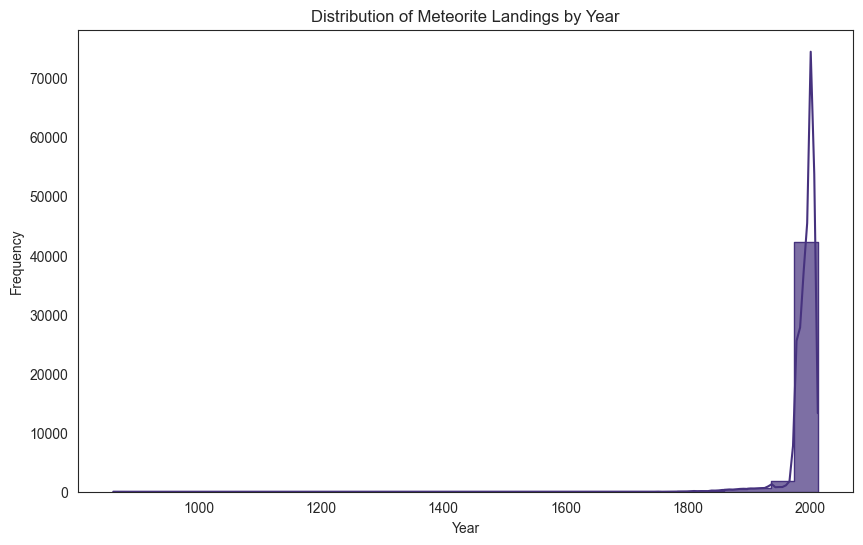

In [110]:
# Set the style and color palette
sns.set_style("white")
sns.set_palette("viridis")

# Plot the histogram
plt.figure(figsize=(10, 6))
ax = sns.histplot(data=meteo_db, x='year', bins=30, kde=True, alpha=0.7, element='step')
plt.title('Distribution of Meteorite Landings by Year')
plt.xlabel('Year')
plt.ylabel('Frequency')

# Display values on top of each bar if there are any bars
if ax.containers:
    for bar in ax.containers[0]:
        height = bar.get_height()
        ax.annotate(f'{int(height)}', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

plt.show()

Most of the meteorites were found after 1800. this can mean two things: 1) the data is collected more in these years and increased number of found meteorites. 2) Maximum meteorites did fall in these years.

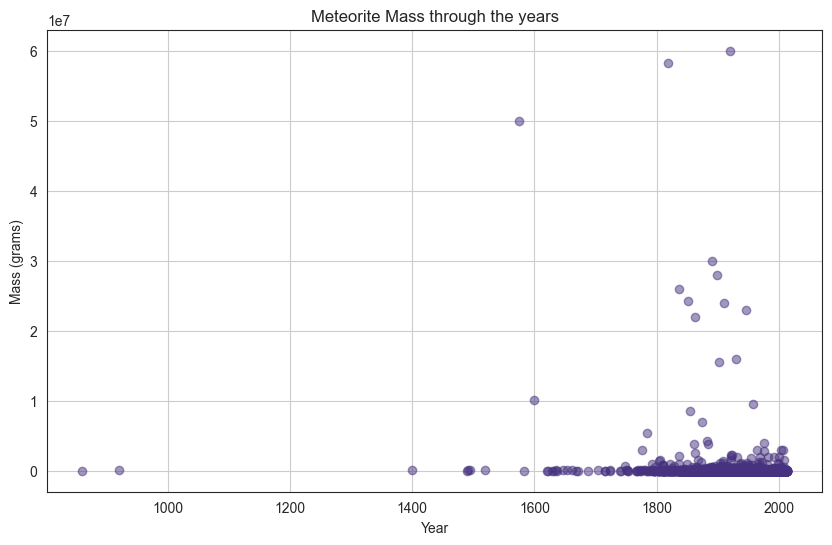

In [111]:
plt.figure(figsize=(10, 6))
plt.scatter(meteo_db['year'], meteo_db['mass_g'], alpha=0.5)
plt.title('Meteorite Mass through the years')
plt.xlabel('Year')
plt.ylabel('Mass (grams)')
plt.grid(True)
plt.show()

C:\Users\migde\AppData\Local\Temp\ipykernel_37160\3125403252.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i, fall_count[i] - 0.1 * fall_count[i], str(fall_count[i]), ha='center', va='bottom', fontsize=16)


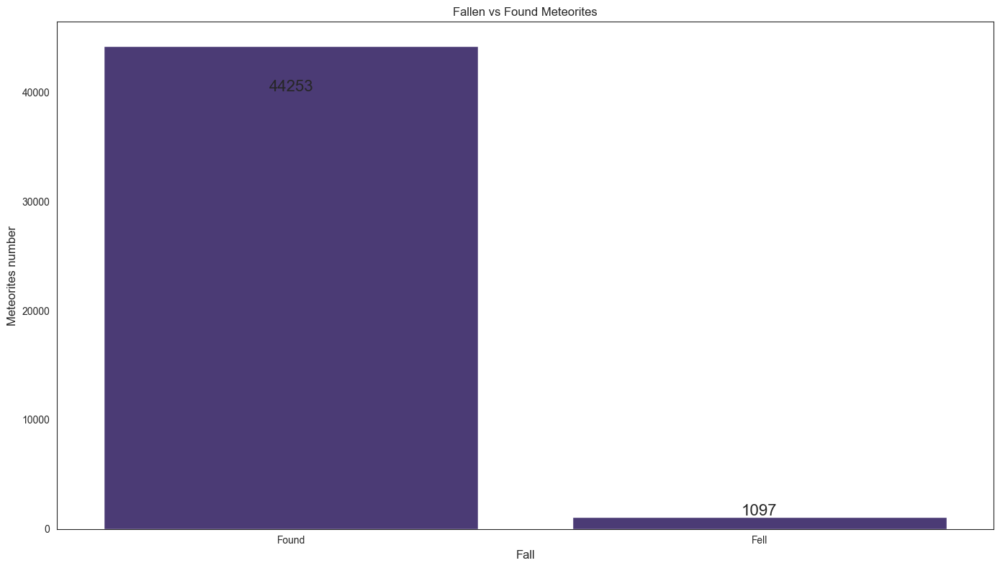

In [112]:
fall_count = meteo_db['fall'].value_counts()

plt.figure(figsize=(14, 8))
fall_graph = sns.barplot(x=fall_count.index, y=fall_count.values)

# Agregar etiquetas de texto dentro de las barras
for i in range(len(fall_count)):
    plt.text(i, fall_count[i] - 0.1 * fall_count[i], str(fall_count[i]), ha='center', va='bottom', fontsize=16)

plt.title('Fallen vs Found Meteorites')
plt.xlabel('Fall', fontsize=12)
plt.ylabel('Meteorites number', fontsize=12)

plt.tight_layout()
plt.show()

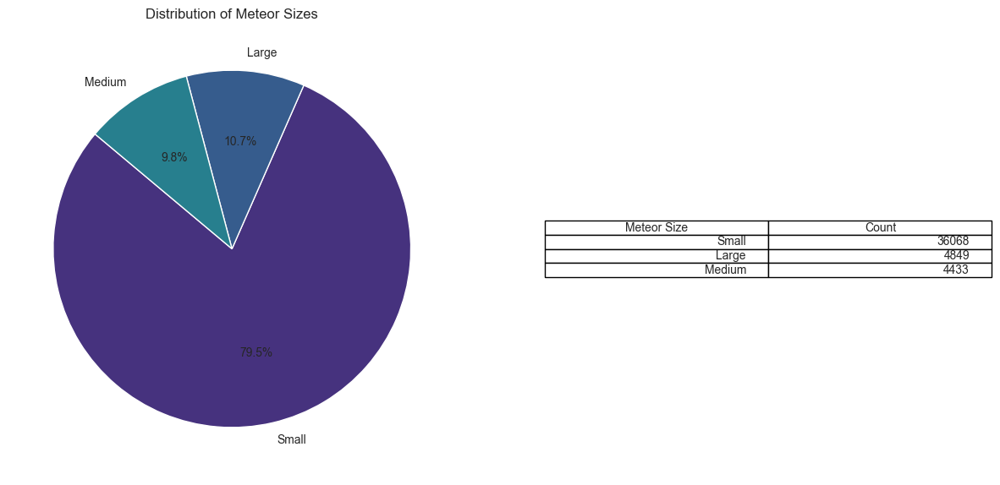

In [113]:
# Counting occurrences of each meteor size
meteor_counts = meteo_db['meteor_size'].value_counts()

# Calculating percentages
meteor_percentages = (meteor_counts / meteor_counts.sum()) * 100

# Plotting the pie chart and table graph side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))

# Pie chart
ax1.pie(meteor_counts, labels=meteor_counts.index, autopct='%1.1f%%', startangle=140)
ax1.set_title('Distribution of Meteor Sizes')

# Table graph
table_data = pd.DataFrame({'Meteor Size': meteor_counts.index, 'Count': meteor_counts})
ax2.axis('off')  # Hide axis
table = ax2.table(cellText=table_data.values, colLabels=table_data.columns, loc='center')
table.auto_set_font_size(True)
table.set_fontsize(10)

plt.show()


In [114]:
meteo_db.head()


,name,id,nametype,recclass,mass_g,fall,year,reclat,reclong,major_class_meteor,meteorite_category,meteor_size
0,Aachen,1,Valid,L,21.0,Fell,1880,50.77500,6.08333,Ordinary Chondrite,Chondrite,Small
1,Aarhus,2,Valid,H,720.0,Fell,1951,56.18333,10.23333,Ordinary Chondrite,Chondrite,Medium
2,Abee,6,Valid,EH,107000.0,Fell,1952,54.21667,-113.00000,Enstatite Chondrite,Chondrite,Large
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,1976,16.88333,-99.90000,Achondrite,Achondrite,Large
4,Achiras,370,Valid,L,780.0,Fell,1902,-33.16667,-64.95000,Ordinary Chondrite,Chondrite,Medium


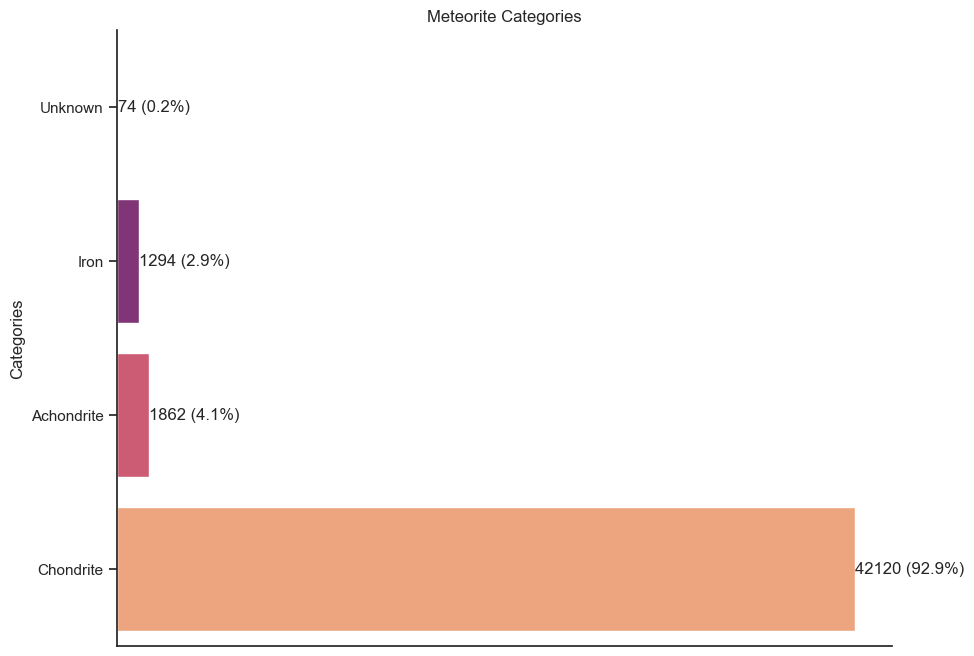

In [115]:
import seaborn as sns
import matplotlib.pyplot as plt

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
meteorite_counts = meteo_db['meteorite_category'].value_counts().sort_values()

# Calculate percentages
total = meteorite_counts.sum()
percentages = (meteorite_counts / total) * 100

# Plotting the barplot
plt.figure(figsize=(10, 8))
barplot = sns.barplot(x=meteorite_counts.values, y=meteorite_counts.index, hue=meteorite_counts.index, palette='magma')

# Displaying values and percentages inside the bars
for i, (value, percentage) in enumerate(zip(meteorite_counts.values, percentages)):
    plt.text(value, i, f'{value} ({percentage:.1f}%)', va='center')

plt.title("Meteorite Categories")
plt.ylabel("Categories")

# Hide the x-axis
plt.gca().axes.get_xaxis().set_visible(False)

plt.show()


Because there are too much rows/landings, a map of the 10% of the observations will be displayed.

In [116]:
# Sample 10% of the DataFrame
sampled_df = meteo_db.sample(frac=0.1, random_state=42)

# Create a map centered at a specific location
m = folium.Map(location=[sampled_df['reclat'].mean(), sampled_df['reclong'].mean()], zoom_start=3)

# Add markers for each location based on latitude and longitude
for index, row in sampled_df.iterrows():
    folium.Marker([row['reclat'], row['reclong']], 
                  popup=f"{row['name']}, {row['mass_g']} grams", 
                  tooltip=f"Year: {row['year']}, Class: {row['major_class_meteor']}").add_to(m)

# Display the map
m

In [122]:
m.save('m.html')
HTML(filename='m.html')

In [124]:
webbrowser.open_new_tab('m.html')

True